In [2]:
!pip install opencv-python matplotlib numpy scikit-image
!pip install scikit-image --upgrade

In [31]:
from google.colab import drive
import cv2
import matplotlib.pyplot as plt
import os


# Load a sample image

drive.mount('/content/drive')


base_path = "/content/drive/MyDrive/WarpDoc/"

distortions = ["curved", "fold", "incomplete", "perspective", "random", "rotate"]

digital_path = os.path.join(base_path, "digital")
distorted_path = os.path.join(base_path, "distorted")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [32]:
import cv2
import matplotlib.pyplot as plt
import random

# Pick a random distortion type
random_folder = random.choice(distortions)

# Pick a random image (e.g., 0000.jpg to 0099.jpg)
random_image = f"{str(random.randint(0, 99)).zfill(4)}.jpg"

sample_distorted = os.path.join(distorted_path, random_folder, random_image)

image1 = cv2.imread(sample_distorted, cv2.IMREAD_GRAYSCALE)


# Resize to a fixed size (e.g., 128x128 for model training)
target_size = (512, 512)
image = cv2.resize(image1, target_size, interpolation=cv2.INTER_AREA)



In [33]:

#Edge Detection function for extract the edges of the images
def detect_edges(image, blur_ksize=19, canny_thresh1=20, canny_thresh2=50):

    blurred = cv2.GaussianBlur(image, (blur_ksize, blur_ksize), 0)
    edges = cv2.Canny(blurred, canny_thresh1, canny_thresh2)
    return edges
edges = detect_edges(image, blur_ksize=15, canny_thresh1=50, canny_thresh2=120)




In [34]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

import numpy as np
import cv2
import matplotlib.pyplot as plt


"""
    Applies the Hough Transform to detect straight lines from a binary edge map.

    Parameters:
        edges (ndarray): Binary edge image (e.g., from Canny).
        rho_res (float): Distance resolution of the accumulator in pixels.
        theta_res (float): Angle resolution of the accumulator in radians.
        threshold (int): Minimum number of votes required to consider a line.

    Returns:
        lines (list): List of (rho, theta) tuples for detected lines.
        accumulator (ndarray): Hough accumulator array.
        rhos (ndarray): Array of rho values used.
        thetas (ndarray): Array of theta values used.
"""

def hough_transform(edges, rho_res=1, theta_res=np.pi/180, threshold=50):

    height, width = edges.shape
    max_rho = int(np.hypot(height, width))
    rhos = np.arange(-max_rho, max_rho, rho_res)
    thetas = np.arange(0, np.pi, theta_res)

    accumulator = np.zeros((len(rhos), len(thetas)), dtype=np.int32)

    y_idxs, x_idxs = np.where(edges > 0)

    for i in range(len(x_idxs)):
        x = x_idxs[i]
        y = y_idxs[i]
        for j in range(len(thetas)):
            rho = int(x * np.cos(thetas[j]) + y * np.sin(thetas[j])) + max_rho
            if 0 <= rho < len(rhos):
                accumulator[rho, j] += 1

    indices = np.argwhere(accumulator > threshold)
    lines = [(rhos[r], thetas[t]) for r, t in indices]

    return lines, accumulator, rhos, thetas

"""
    Draws the detected Hough lines on an image using (rho, theta) parameters.

    Parameters:
        image (ndarray): Input image (grayscale or RGB).
        lines (list): List of (rho, theta) tuples representing lines.
        color (tuple): RGB color for line drawing (default is red).

    Returns:
        image_with_lines1 (ndarray): Image with drawn lines.
"""

def draw_hough_lines(image, lines ,color=(255, 0, 0)):


    image_with_lines1 = image
    if len(image.shape) == 3 and image.shape[2] == 3:
        image_with_lines1 = cv2.cvtColor(image_with_lines1, cv2.COLOR_RGB2BGR)

    for rho, theta in lines:
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(image_with_lines1, (x1, y1), (x2, y2), color, 2)
    return image_with_lines1


lines, accumulator, rhos, thetas = hough_transform(edges, threshold=100)
image_with_lines1 = draw_hough_lines(edges, lines)



In [35]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# Calculates the perpendicular distance from a point to a line (ax + by + c = 0)
def point_line_distance(point, line):
    x, y = point
    a, b, c = line
    return abs(a * x + b * y + c) / np.sqrt(a**2 + b**2)

def fit_line(p1, p2):
    x1, y1 = p1
    x2, y2 = p2
    a = y2 - y1
    b = x1 - x2
    c = x2 * y1 - x1 * y2
    return (a, b, c)

# Applies RANSAC to find the line with the most inliers among a set of points
def ransac_line_fitting(points, iterations=1000, threshold=2, min_inliers=40):
    best_line = None
    best_inliers = []

    for _ in range(iterations):
        if len(points) < 2:
            break
        p1, p2 = random.sample(points, 2)
        line = fit_line(p1, p2)
        inliers = [pt for pt in points if point_line_distance(pt, line) < threshold]

        if len(inliers) > len(best_inliers):
            best_line = line
            best_inliers = inliers

        if len(best_inliers) > min_inliers:
            break

    return best_line, best_inliers


# Draws a detected line on the image using its (a, b, c) representation

def draw_ransac_line(image, line, color=(255, 0, 255), thickness=5):
    a, b, c = line
    height, width = image.shape[:2]

    if b != 0:
        y0 = int(-c / b)
        y1 = int((-a * width - c) / b)
        pt1 = (0, y0)
        pt2 = (width, y1)
    else:
        x = int(-c / a)
        pt1 = (x, 0)
        pt2 = (x, height)

    img_copy = image.copy()
    cv2.line(img_copy, pt1, pt2, color, thickness)
    return img_copy

def classify_lines_by_orientation(lines):
    vertical_lines = []
    horizontal_lines = []
    for rho, theta in lines:
        angle = theta % np.pi
        if angle < np.pi / 4 or angle > 3 * np.pi / 4:
            vertical_lines.append((rho, theta))  # dikey
        else:
            horizontal_lines.append((rho, theta))  # yatay
    return vertical_lines, horizontal_lines

def find_best_ransac_lines_by_direction(image, line_groups, max_lines=3):
    result_lines = []
    for group in line_groups:
        group_points = []
        for rho, theta in group:
            a = np.cos(theta)
            b = np.sin(theta)
            x0 = a * rho
            y0 = b * rho
            for t in np.linspace(-300, 300, 20):
                x = int(x0 + t * (-b))
                y = int(y0 + t * (a))
                if 0 <= x < image.shape[1] and 0 <= y < image.shape[0]:
                    group_points.append((x, y))

        remaining_points = group_points.copy()
        for _ in range(max_lines):
            if len(remaining_points) < 2:
                break
            line, inliers = ransac_line_fitting(remaining_points)
            if line is not None:
                result_lines.append(line)
                remaining_points = [pt for pt in remaining_points if pt not in inliers]

    return result_lines


# Selects the two strongest vertical and two strongest horizontal lines based on distance from origin

def select_best_two_lines_per_orientation(lines):
    verticals = []
    horizontals = []

    for line in lines:
        a, b, c = line
        angle = np.arctan2(-a, b) % np.pi
        if angle < np.pi / 4 or angle > 3 * np.pi / 4:
            verticals.append(line)
        else:
            horizontals.append(line)

    def line_distance_from_origin(line):
        a, b, c = line
        return abs(c) / np.sqrt(a**2 + b**2)

    verticals = sorted(verticals, key=line_distance_from_origin, reverse=True)[:2]
    horizontals = sorted(horizontals, key=line_distance_from_origin, reverse=True)[:2]

    return verticals + horizontals

# image: gri görüntü
# lines: Hough Transform'dan gelen (rho, theta) doğruları

vertical_lines, horizontal_lines = classify_lines_by_orientation(lines)

ransac_verticals = find_best_ransac_lines_by_direction(image, [vertical_lines], max_lines=3)
ransac_horizontals = find_best_ransac_lines_by_direction(image, [horizontal_lines], max_lines=3)

all_ransac_lines = ransac_verticals + ransac_horizontals

final_ransac_lines = select_best_two_lines_per_orientation(all_ransac_lines)

image_ransac = image.copy()
for line in final_ransac_lines:
    image_ransac = draw_ransac_line(image_ransac, line)




def scale_line_to_original(line, scale_x, scale_y):
    a, b, c = line
    a_scaled = a / scale_x
    b_scaled = b / scale_y
    c_scaled = c
    return (a_scaled, b_scaled, c_scaled)

h_small, w_small = 512, 512  # RANSAC uygulanmış boyut
h_orig, w_orig = image1.shape[:2]

scale_x = w_orig / w_small
scale_y = h_orig / h_small


final_ransac_lines_scaled = [
    scale_line_to_original(line, scale_x, scale_y)
    for line in final_ransac_lines
]


image_draw = image1.copy()  # image1: orijinal çözünürlüktek

for line in final_ransac_lines_scaled:
    image_draw = draw_ransac_line(image_draw, line )



<ipython-input-35-3f07fcb2beac>:10: RuntimeWarning: invalid value encountered in scalar divide
  return abs(a * x + b * y + c) / np.sqrt(a**2 + b**2)


In [36]:
# Computes the intersection point of two lines given in ax + by + c = 0 form

def intersection_point(line1, line2):

    a1, b1, c1 = line1
    a2, b2, c2 = line2

    determinant = a1 * b2 - a2 * b1
    if determinant == 0:
        return None  # paralel doğrular
    x = (b1 * c2 - b2 * c1) / determinant
    y = (a2 * c1 - a1 * c2) / determinant
    return (int(x), int(y))

# Extracts the four intersection points (corners) from a set of lines

def get_intersections_from_4_lines(lines):

    if len(lines) < 4:

        return [None, None, None, None]

    verticals = []
    horizontals = []

    for line in lines:
        a, b, c = line
        angle = np.arctan2(-a, b) % np.pi
        if angle < np.pi / 4 or angle > 3 * np.pi / 4:
            verticals.append(line)
        else:
            horizontals.append(line)

    if len(verticals) < 2 or len(horizontals) < 2:

        return [None, None, None, None]

    def line_dist(line):
        a, b, c = line
        return abs(c) / np.sqrt(a**2 + b**2)

    verticals = sorted(verticals, key=line_dist, reverse=True)[:2]
    horizontals = sorted(horizontals, key=line_dist, reverse=True)[:2]

    p1 = intersection_point(verticals[0], horizontals[0])
    p2 = intersection_point(verticals[1], horizontals[0])
    p3 = intersection_point(verticals[1], horizontals[1])
    p4 = intersection_point(verticals[0], horizontals[1])

    return [p1, p2, p3, p4]


# Takes source points (detected corners) and maps them to a fixed rectangle

def warp_perspective_from_quad(image, corners):

    width = 600
    height = 800

    dst_pts = np.float32([
        [0, 0],
        [width - 1, 0],
        [width - 1, height - 1],
        [0, height - 1]
    ])
    src_pts = np.float32(corners)

    M = cv2.getPerspectiveTransform(src_pts, dst_pts)
    warped = cv2.warpPerspective(image, M, (width, height))

    return warped

quad_corners = get_intersections_from_4_lines(final_ransac_lines_scaled)


warped_image = warp_perspective_from_quad(image1, quad_corners)

# 90 derece sola döndür
rotated = cv2.rotate(warped_image, cv2.ROTATE_90_COUNTERCLOCKWISE)






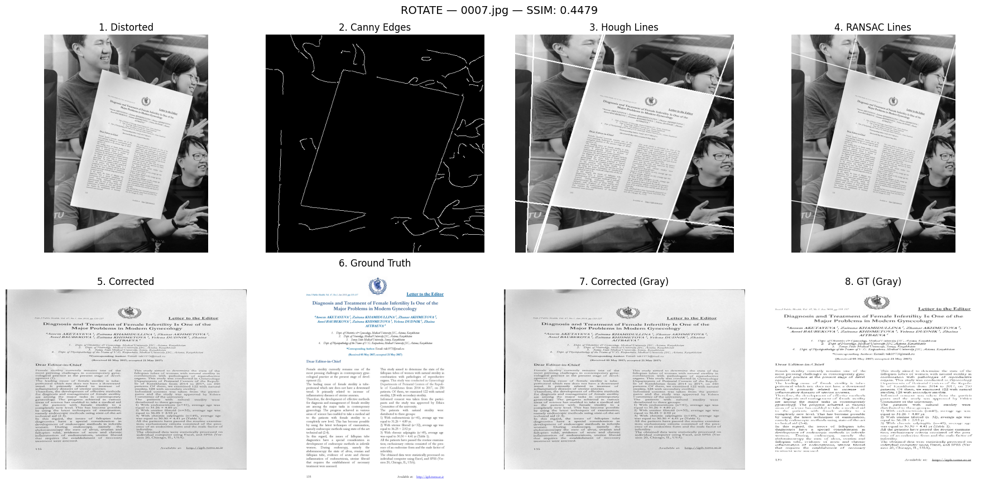

<ipython-input-6-24da164ce609>:10: RuntimeWarning: invalid value encountered in scalar divide
  return abs(a * x + b * y + c) / np.sqrt(a**2 + b**2)


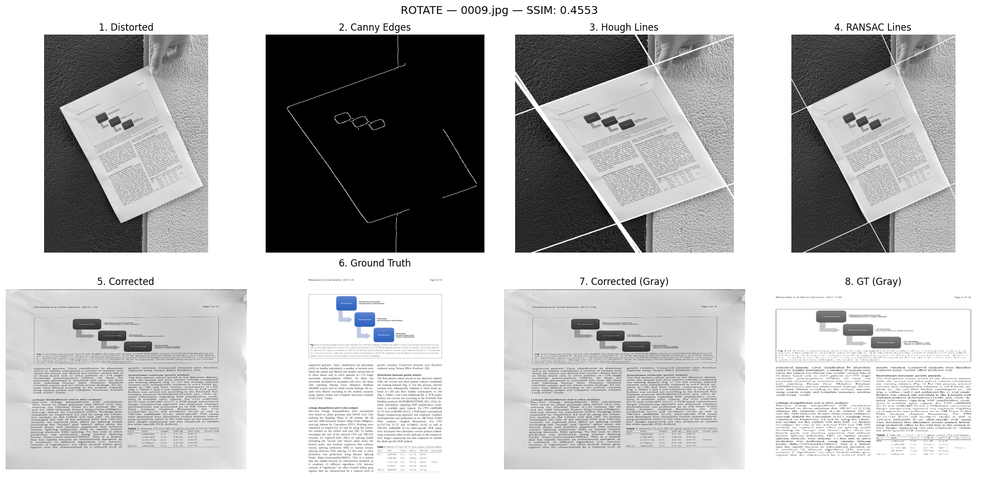

In [9]:

# Visualizes the document rectification pipeline step-by-step for selected image filenames.
# Applies preprocessing, Hough Transform, RANSAC line detection, warping, and SSIM evaluation.

def visualize_pipeline_for_files(filenames, class_name, base_path="/content/drive/MyDrive/WarpDoc"):
    distorted_dir = os.path.join(base_path, "distorted", class_name)
    digital_dir = os.path.join(base_path, "digital", class_name)

    for filename in filenames:
        distorted_path = os.path.join(distorted_dir, filename)
        gt_path = os.path.join(digital_dir, filename)

        image_distorted = cv2.imread(distorted_path, cv2.IMREAD_GRAYSCALE)
        gt_image = cv2.imread(gt_path)

        if image_distorted is None or gt_image is None:
            print(f" Dosya bulunamadı: {filename}")
            continue

        imagerz = cv2.resize(image_distorted, (512, 512), interpolation=cv2.INTER_AREA)
        edges = detect_edges(imagerz, blur_ksize=19, canny_thresh1=80, canny_thresh2=100)

        lines, _, _, _ = hough_transform(edges, threshold=100)
        vertical_lines, horizontal_lines = classify_lines_by_orientation(lines)
        hough_image = draw_hough_lines(imagerz, lines)

        ransac_verticals = find_best_ransac_lines_by_direction(imagerz, [vertical_lines], max_lines=3)
        ransac_horizontals = find_best_ransac_lines_by_direction(imagerz, [horizontal_lines], max_lines=3)
        final_lines = select_best_two_lines_per_orientation(ransac_verticals + ransac_horizontals)

        scale_x = image_distorted.shape[1] / 512
        scale_y = image_distorted.shape[0] / 512
        scaled_lines = [scale_line_to_original(line, scale_x, scale_y) for line in final_lines]

        ransac_scaled_draw = image_distorted.copy()
        for line in scaled_lines:
            ransac_scaled_draw = draw_ransac_line(ransac_scaled_draw, line)

        corners = get_intersections_from_4_lines(scaled_lines)
        if None in corners:
            print(f" Kesişim bulunamadı: {filename}")
            continue

        warped = warp_perspective_from_quad(image_distorted, corners)
        rotated = cv2.rotate(warped, cv2.ROTATE_90_COUNTERCLOCKWISE)
        corrected = cv2.flip(rotated, 1)

        gt_gray = cv2.cvtColor(gt_image, cv2.COLOR_BGR2GRAY)
        corrected_gray = corrected if len(corrected.shape) == 2 else cv2.cvtColor(corrected, cv2.COLOR_BGR2GRAY)
        gt_gray = cv2.resize(gt_gray, (corrected_gray.shape[1], corrected_gray.shape[0]))
        score = ssim(gt_gray, corrected_gray)

        fig, axs = plt.subplots(2, 4, figsize=(18, 9))
        fig.suptitle(f"{class_name.upper()} — {filename} — SSIM: {score:.4f}", fontsize=14)

        axs[0, 0].imshow(image_distorted, cmap="gray")
        axs[0, 0].set_title("1. Distorted")
        axs[0, 0].axis("off")

        axs[0, 1].imshow(edges, cmap="gray")
        axs[0, 1].set_title("2. Canny Edges")
        axs[0, 1].axis("off")

        axs[0, 2].imshow(hough_image, cmap="gray")
        axs[0, 2].set_title("3. Hough Lines")
        axs[0, 2].axis("off")

        axs[0, 3].imshow(ransac_scaled_draw, cmap="gray")
        axs[0, 3].set_title("4. RANSAC Lines")
        axs[0, 3].axis("off")

        axs[1, 0].imshow(corrected, cmap="gray")
        axs[1, 0].set_title("5. Corrected")
        axs[1, 0].axis("off")

        axs[1, 1].imshow(cv2.cvtColor(gt_image, cv2.COLOR_BGR2RGB))
        axs[1, 1].set_title("6. Ground Truth")
        axs[1, 1].axis("off")

        axs[1, 2].imshow(corrected_gray, cmap="gray")
        axs[1, 2].set_title("7. Corrected (Gray)")
        axs[1, 2].axis("off")

        axs[1, 3].imshow(gt_gray, cmap="gray")
        axs[1, 3].set_title("8. GT (Gray)")
        axs[1, 3].axis("off")

        plt.tight_layout()
        plt.show()

# Run pipeline on two example images from the 'rotate' class

visualize_pipeline_for_files(
    filenames=["0007.jpg", "0009.jpg"],
    class_name="rotate"
)


In [12]:
def visualize_pipeline_for_files(filenames, class_name, base_path="/content/drive/MyDrive/WarpDoc"):
    distorted_dir = os.path.join(base_path, "distorted", class_name)
    digital_dir = os.path.join(base_path, "digital", class_name)

    for filename in filenames:
        distorted_path = os.path.join(distorted_dir, filename)
        gt_path = os.path.join(digital_dir, filename)

        image_distorted = cv2.imread(distorted_path, cv2.IMREAD_GRAYSCALE)
        gt_image = cv2.imread(gt_path)

        if image_distorted is None or gt_image is None:
            print(f" Dosya bulunamadı: {filename}")
            continue

        imagerz = cv2.resize(image_distorted, (512, 512), interpolation=cv2.INTER_AREA)
        #edges = detect_edges(imagerz, blur_ksize=19, canny_thresh1=50, canny_thresh2=100)
        edges = detect_edges(imagerz)
        lines, _, _, _ = hough_transform(edges, threshold=100)
        vertical_lines, horizontal_lines = classify_lines_by_orientation(lines)
        hough_image = draw_hough_lines(imagerz, lines)

        ransac_verticals = find_best_ransac_lines_by_direction(imagerz, [vertical_lines], max_lines=3)
        ransac_horizontals = find_best_ransac_lines_by_direction(imagerz, [horizontal_lines], max_lines=3)
        final_lines = select_best_two_lines_per_orientation(ransac_verticals + ransac_horizontals)

        scale_x = image_distorted.shape[1] / 512
        scale_y = image_distorted.shape[0] / 512
        scaled_lines = [scale_line_to_original(line, scale_x, scale_y) for line in final_lines]

        ransac_scaled_draw = image_distorted.copy()
        for line in scaled_lines:
            ransac_scaled_draw = draw_ransac_line(ransac_scaled_draw, line)

        corners = get_intersections_from_4_lines(scaled_lines)
        if None in corners:
            print(f" Kesişim bulunamadı: {filename}")
            continue

        warped = warp_perspective_from_quad(image_distorted, corners)
        rotated = cv2.rotate(warped, cv2.ROTATE_90_COUNTERCLOCKWISE)
        corrected = cv2.flip(rotated, 1)

        gt_gray = cv2.cvtColor(gt_image, cv2.COLOR_BGR2GRAY)
        corrected_gray = corrected if len(corrected.shape) == 2 else cv2.cvtColor(corrected, cv2.COLOR_BGR2GRAY)
        gt_gray = cv2.resize(gt_gray, (corrected_gray.shape[1], corrected_gray.shape[0]))
        score = ssim(gt_gray, corrected_gray)

        fig, axs = plt.subplots(2, 4, figsize=(18, 9))
        fig.suptitle(f"{class_name.upper()} — {filename} — SSIM: {score:.4f}", fontsize=14)

        axs[0, 0].imshow(image_distorted, cmap="gray")
        axs[0, 0].set_title("1. Distorted")
        axs[0, 0].axis("off")

        axs[0, 1].imshow(edges, cmap="gray")
        axs[0, 1].set_title("2. Canny Edges")
        axs[0, 1].axis("off")

        axs[0, 2].imshow(hough_image, cmap="gray")
        axs[0, 2].set_title("3. Hough Lines")
        axs[0, 2].axis("off")

        axs[0, 3].imshow(ransac_scaled_draw, cmap="gray")
        axs[0, 3].set_title("4. RANSAC Lines")
        axs[0, 3].axis("off")

        axs[1, 0].imshow(corrected, cmap="gray")
        axs[1, 0].set_title("5. Corrected")
        axs[1, 0].axis("off")

        axs[1, 1].imshow(cv2.cvtColor(gt_image, cv2.COLOR_BGR2RGB))
        axs[1, 1].set_title("6. Ground Truth")
        axs[1, 1].axis("off")

        axs[1, 2].imshow(corrected_gray, cmap="gray")
        axs[1, 2].set_title("7. Corrected (Gray)")
        axs[1, 2].axis("off")

        axs[1, 3].imshow(gt_gray, cmap="gray")
        axs[1, 3].set_title("8. GT (Gray)")
        axs[1, 3].axis("off")

        plt.tight_layout()
        plt.show()




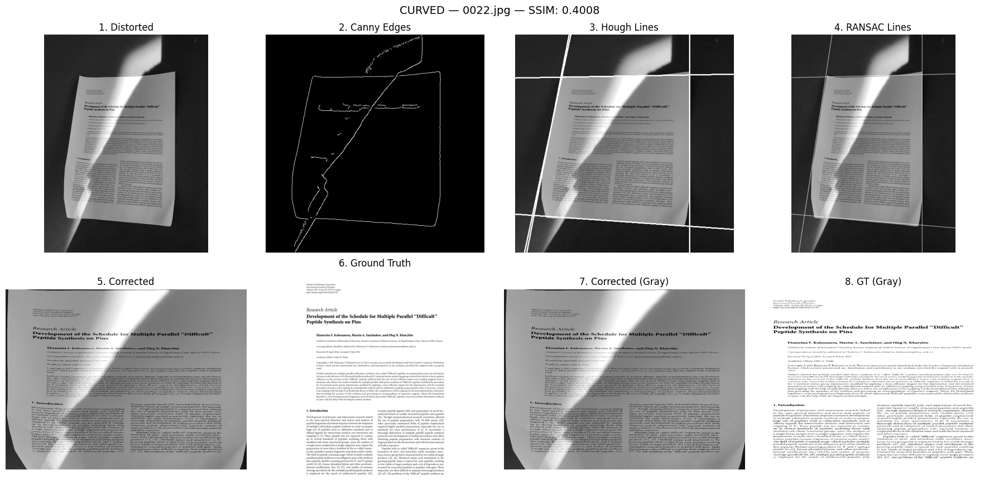

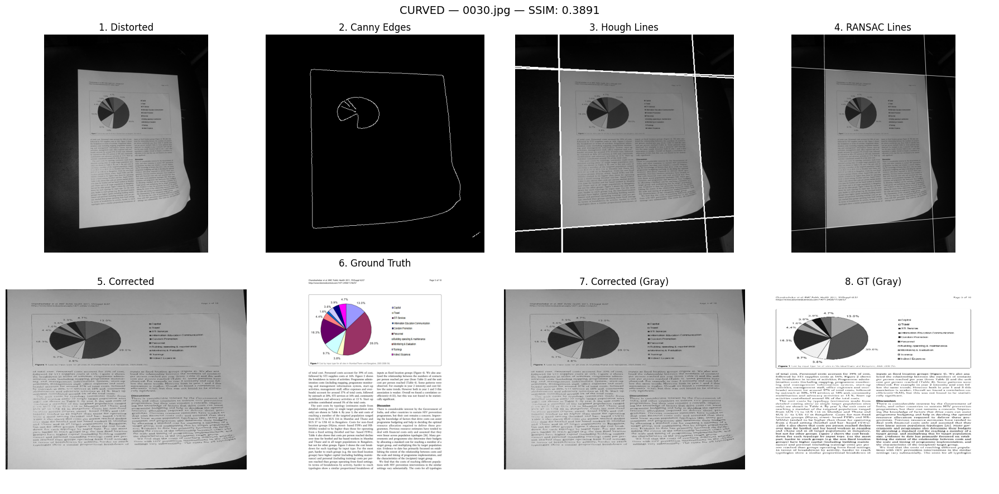

In [13]:
# Run pipeline on two example images from the 'curved' class

visualize_pipeline_for_files(
    filenames=["0022.jpg", "0030.jpg"],
    class_name="curved"
)

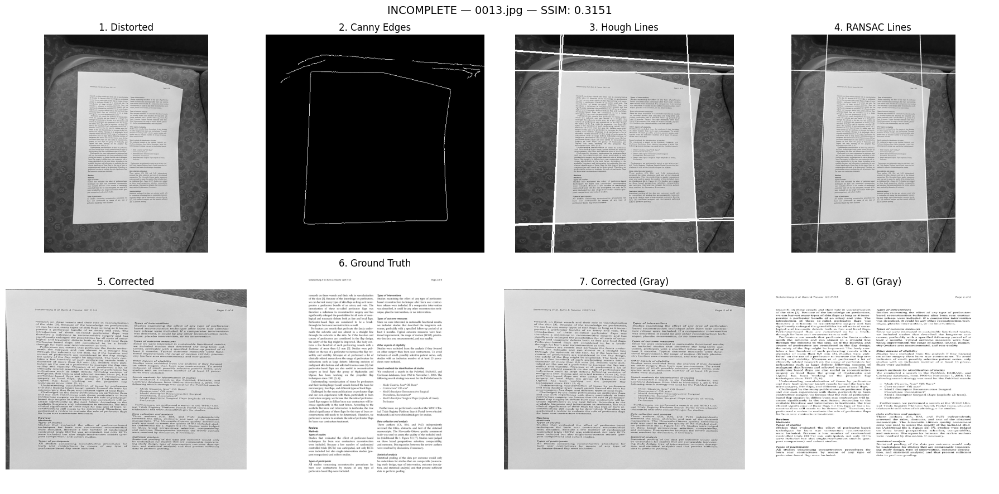

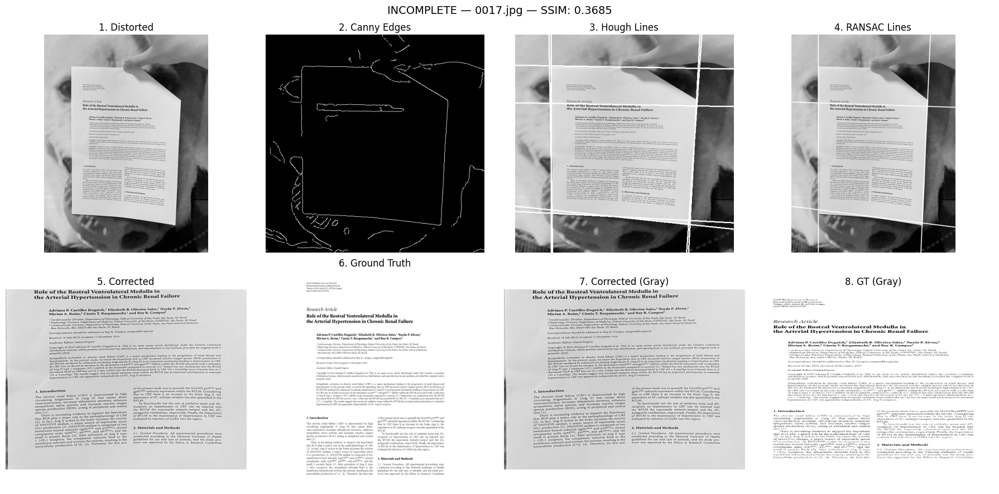

In [29]:
# Run pipeline on two example images from the 'incomplete' class

visualize_pipeline_for_files(
    filenames=["0013.jpg", "0017.jpg"],
    class_name="incomplete"
)


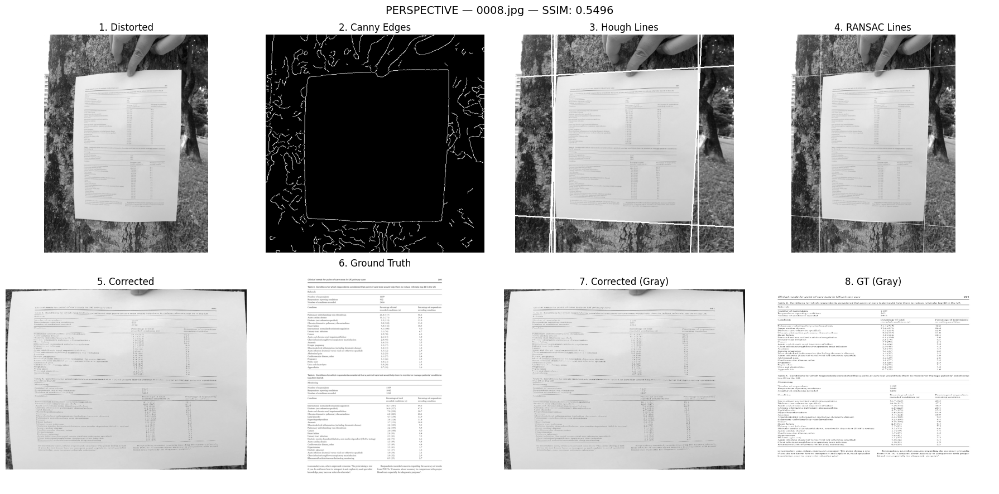

<ipython-input-7-24da164ce609>:10: RuntimeWarning: invalid value encountered in scalar divide
  return abs(a * x + b * y + c) / np.sqrt(a**2 + b**2)


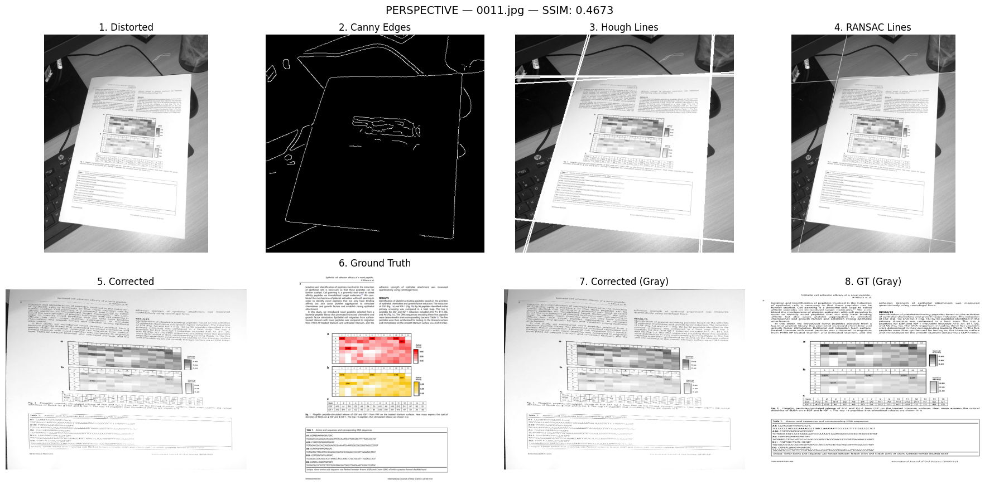

In [21]:
# Run pipeline on two example images from the 'perspective' class

visualize_pipeline_for_files(
    filenames=["0008.jpg", "0011.jpg"],
    class_name="perspective"
)


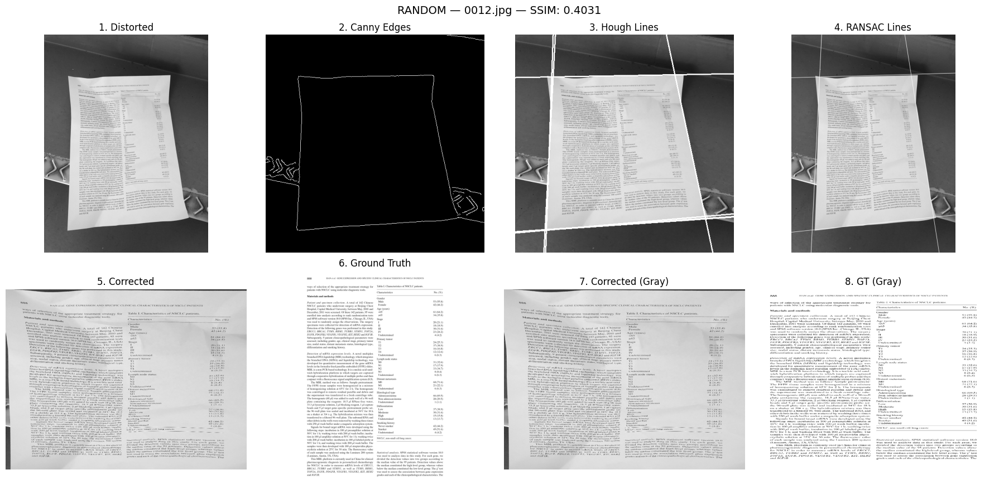

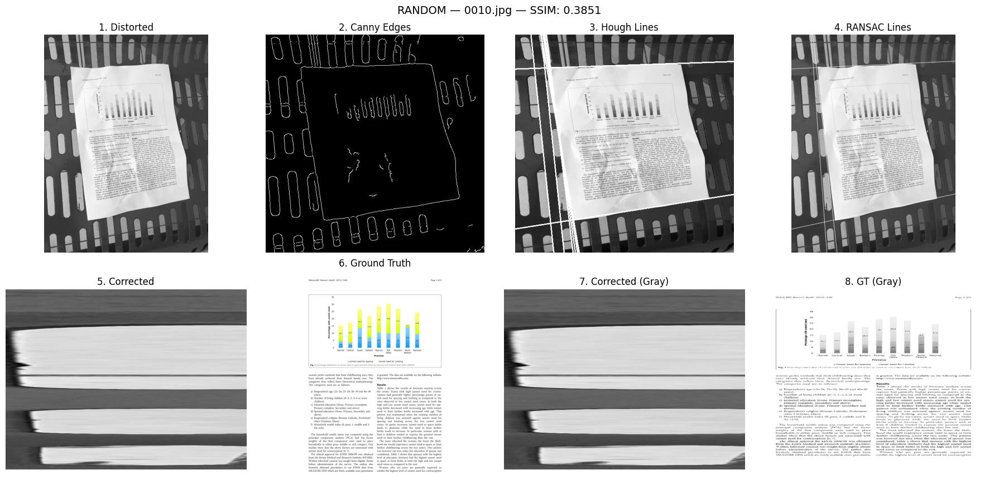

In [25]:
# Run pipeline on two example images from the 'random' class

visualize_pipeline_for_files(
    filenames=["0012.jpg", "0010.jpg"],
    class_name="random"
)



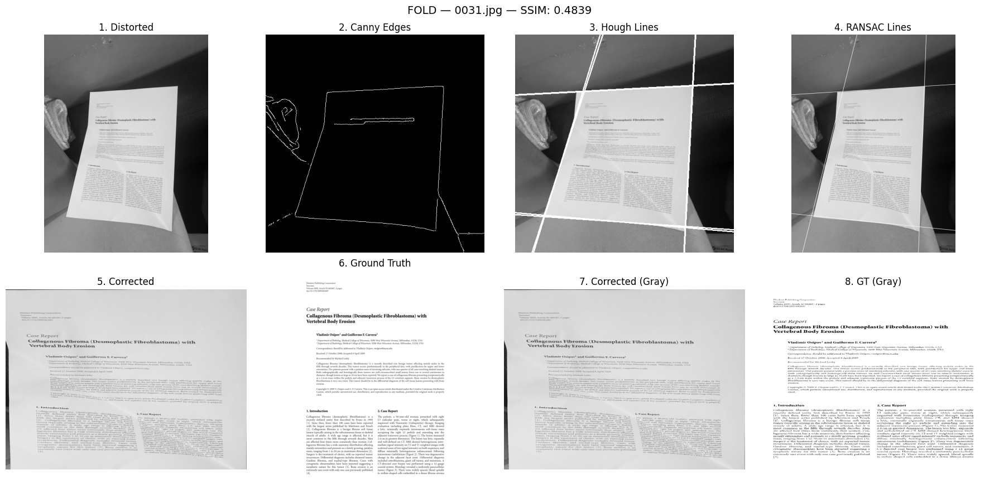

<ipython-input-7-24da164ce609>:10: RuntimeWarning: invalid value encountered in scalar divide
  return abs(a * x + b * y + c) / np.sqrt(a**2 + b**2)


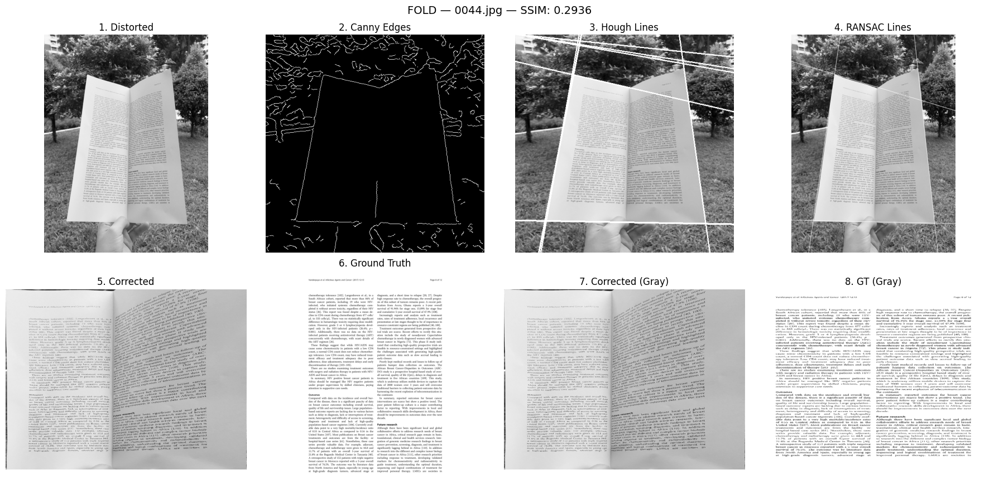

In [24]:
# Run pipeline on two example images from the 'fold' class

visualize_pipeline_for_files(
    filenames=["0031.jpg", "0044.jpg"],
    class_name="fold"
)



In [30]:
import os
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim
from google.colab import drive


drive.mount('/content/drive')

# Base paths and class folders
base_path = "/content/drive/MyDrive/WarpDoc"
classes = ["curved", "fold", "incomplete", "perspective", "random", "rotate"]

# === Functions ===
# - detect_edges
# - hough_transform
# - draw_hough_lines
# - classify_lines_by_orientation
# - find_best_ransac_lines_by_direction
# - select_best_two_lines_per_orientation
# - scale_line_to_original
# - get_intersections_from_4_lines
# - warp_perspective_from_quad


# Compute SSIM score between corrected image and its ground-truth counterpart

def compute_ssim_for_pair(distorted_path, ground_truth_path):
    try:
        image1 = cv2.imread(distorted_path, cv2.IMREAD_GRAYSCALE)
        gt_image = cv2.imread(ground_truth_path)

        if image1 is None or gt_image is None:
            return None

        image = cv2.resize(image1, (512, 512), interpolation=cv2.INTER_AREA)
        edges = detect_edges(image)
        lines, _, _, _ = hough_transform(edges, threshold=100)
        vertical_lines, horizontal_lines = classify_lines_by_orientation(lines)

        ransac_verticals = find_best_ransac_lines_by_direction(image, [vertical_lines], max_lines=3)
        ransac_horizontals = find_best_ransac_lines_by_direction(image, [horizontal_lines], max_lines=3)
        all_ransac_lines = ransac_verticals + ransac_horizontals
        final_ransac_lines = select_best_two_lines_per_orientation(all_ransac_lines)

        scale_x = image1.shape[1] / 512
        scale_y = image1.shape[0] / 512
        scaled_lines = [scale_line_to_original(line, scale_x, scale_y) for line in final_ransac_lines]

        corners = get_intersections_from_4_lines(scaled_lines)
        if None in corners:
            return None

        warped = warp_perspective_from_quad(image1, corners)
        rotated = cv2.rotate(warped, cv2.ROTATE_90_COUNTERCLOCKWISE)
        corrected = cv2.flip(rotated, 1)

        if len(gt_image.shape) == 3:
            gt_gray = cv2.cvtColor(gt_image, cv2.COLOR_BGR2GRAY)
        else:
            gt_gray = gt_image

        if len(corrected.shape) == 3:
            corrected_gray = cv2.cvtColor(corrected, cv2.COLOR_BGR2GRAY)
        else:
            corrected_gray = corrected

        gt_gray = cv2.resize(gt_gray, (corrected_gray.shape[1], corrected_gray.shape[0]))

        score = ssim(gt_gray, corrected_gray)
        return score

    except Exception as e:
        print(f"⚠️ Hata: {distorted_path} — {e}")
        return None

# SSIM calculation loop for all classes

results = {}

for cls in classes:
    distorted_dir = os.path.join(base_path, "distorted", cls)
    digital_dir = os.path.join(base_path, "digital", cls)

    if not os.path.exists(distorted_dir) or not os.path.exists(digital_dir):
        continue

    distorted_files = sorted(os.listdir(distorted_dir))[:50]
    scores = []

    for filename in distorted_files:
        distorted_path = os.path.join(distorted_dir, filename)
        gt_path = os.path.join(digital_dir, filename)
        score = compute_ssim_for_pair(distorted_path, gt_path)

        if score is not None:
            scores.append(score)

    if scores:
        mean_ssim = np.mean(scores)
        results[cls] = {
            "mean_ssim": mean_ssim,
            "count": len(scores)
        }
    else:
        results[cls] = {"mean_ssim": None, "count": 0}

print("\n SSIM Sonuçları (Ortalama):")
for cls, data in results.items():
    if data["mean_ssim"] is not None:
        print(f"{cls:<12}: SSIM = {data['mean_ssim']:.4f}")
    else:
        print(f"{cls:<12}: SSIM hesaplanamadı")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-7-24da164ce609>:10: RuntimeWarning: invalid value encountered in scalar divide
  return abs(a * x + b * y + c) / np.sqrt(a**2 + b**2)



 SSIM Sonuçları (Ortalama):
curved      : SSIM = 0.2882
fold        : SSIM = 0.2619
incomplete  : SSIM = 0.2617
perspective : SSIM = 0.2705
random      : SSIM = 0.3246
rotate      : SSIM = 0.2456
